In [1]:
import numpy as np
from ipywidgets import interact
from bokeh.plotting import figure, show, output_notebook
from bokeh.layouts import gridplot
from bokeh.io import push_notebook

output_notebook()

Loading BokehJS ...

## algorithm

In [2]:
def local_regression(x0, X, Y, tau):
    # add bias term
    x0 = np.r_[1, x0]
#     print(x0.shape)
#     print(x0)
    X = np.c_[np.ones(len(X)), X]
#     print("X:" + str(X.shape))
    # fit model: normal equations with kernel
    xw = X.T * radial_kernel(x0, X, tau)
    print("IIIIIIIIII" + str(radial_kernel(x0, X, tau).shape))
#     print("xw:" + str(xw.shape))
    
    beta = np.linalg.pinv(xw @ X) @ xw @ Y
#     print(beta.shape)
    
    # predict value
    return x0 @ beta

In [3]:
def radial_kernel(x0, X, tau):
    return np.exp(np.sum((X - x0) ** 2, axis=1) / (-2 * tau * tau))

In [6]:
print(X.shape)
v = local_regression(0, X, Y, 5)

(1000,)
IIIIIIIIII(1000,)


ValueError: x and y must have same first dimension, but have shapes (1000,) and (1,)

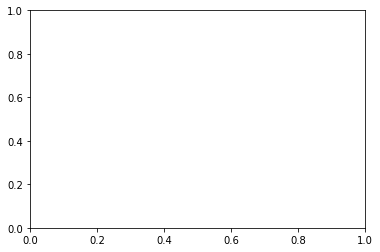

In [69]:
import matplotlib.pyplot as plt
plt.plot(X,v)

## data

In [5]:
n = 1000

# generate dataset
X = np.linspace(-3, 3, num=n)
Y = np.log(np.abs(X ** 2 - 1) + .5)

# jitter X
X += np.random.normal(scale=.1, size=n)

## fit & plot models

In [23]:
v = local_regression(0, X, Y, 5)

(2,)
X:(1000, 2)
xw:(2, 1000)
(2,)


0.7364962929386083

In [59]:
def plot_lwr(tau):
    # prediction
    domain = np.linspace(-3, 3, num=300)
    prediction = [local_regression(x0, X, Y, tau) for x0 in domain]

    plot = figure(plot_width=400, plot_height=400)
    plot.title.text = 'tau=%g' % tau
    plot.scatter(X, Y, alpha=.3)
    plot.line(domain, prediction, line_width=2, color='red')
    
    return plot

In [62]:
show(gridplot([
    [plot_lwr(10.), plot_lwr(1.)],
    [plot_lwr(0.1), plot_lwr(0.01)]
]))

## interactive model

In [17]:
def interactive_update(tau):
    model.data_source.data['y'] = [local_regression(x0, X, Y, tau) for x0 in domain]
    push_notebook()

domain = np.linspace(-3, 3, num=100)
prediction = [local_regression(x0, X, Y, 1.) for x0 in domain]

plot = figure()
plot.scatter(X, Y, alpha=.3)
model = plot.line(domain, prediction, line_width=2, color='red')
show(plot, notebook_handle=True)

(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)
(2,)


In [8]:
interact(interactive_update, tau=(0.01, 3., 0.01))

interactive(children=(FloatSlider(value=1.5, description='tau', max=3.0, min=0.01, step=0.01), Output()), _dom…

<function __main__.interactive_update(tau)>

In [24]:
print(X.shape, Y.shape)

(1000,) (1000,)


In [65]:
X.shape

(1000,)